# Mapping Encampment Service Requests, Park Amenities, and Transit

## Import the Libraries I will be using
1. Pandas
2. Plotly Express
3. Geopandas

In [1]:
import geopandas as gpd
import pandas as pd
import plotly.express as px
import folium

## Datasets
There are 6 datasets I will want to access
1. Park Amenities in LA County
2. Encampment Service Requests via 311 Calls in the City of LA
3. A City of LA Parks Shapefile
4. A City of LA Shapefile with Council Districts
5. Census Tracts Shapefile
6. Census Tract Information

Because 2020 is such an anomaly year, I'm actually going to use 2019 encampment request data for this initial investigation. I've invested a lot of time into cleaning it elsewhere, so I'll use a download instead of Socrata. The Park Amenities are sadly not hosted on Socrata so I'll use a download for that as well.

In [2]:
#bring in the data
#this is a bit more complicated for Census Tract Shapes to avoid missing 0 issue
parks=gpd.read_file('data/LA_Parks_Information.geojson')
encamp_19=gpd.read_file('data/2019-311_Homeless_Encampments_Requests-raw.csv')
resources=gpd.read_file('data/Countywide_Parks_and_Open_Space__Public_-_Hosted_.csv')
city=gpd.read_file('data/la-city-council-districts-2012.geojson')
bus = gpd.read_file('data/Bus Stop Shapefile 2/LineServingStops1219.dbf')
metro = gpd.read_file('data/metro_stations.dbf')
tract_shape=gpd.read_file('data/LA_tracts.geojson')
tracts = pd.read_csv(
    'data/ACS-Data_Pop-Density_Race_Med-Income_Rent-Burden.csv',
    dtype={
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    })

## Clean the Data
I'm going to clean these sets one by one, focusing on making everything lowercase, standardizing naming, and cutting down to just what I need.

### Park Shape Data

In [3]:
#looking at this, we have a few parks not really in LA
#LA has 15 council districts, so anything where cd_real=99 is elswhere
parks=parks.sort_values(by='cd_real',ascending = False)
parks.head()

,name,shape_area,objectid,park_id,name_alpha,shape_leng,area_acres,issubpark,region,address,name_publi,park_class,cd_real,geometry
365,Buena Vista Park,379423.363437,366,282,BUENA VISTA PARK,6974.5619155,8.71039672028,N,M,"Bob Hope Dr, between Warner Blvd and W Riversi...",None,N,99,"MULTIPOLYGON (((-118.32921 34.15218, -118.3297..."
286,William S Hart Park - Dog Park,36302.4743057,287,1002,WILLIAM S HART PARK,773.955801486,0.833393469147,N,NA,"8341 W De Longpre Ave, West Hollywood 90069",William S Hart Dog Park (weho.org),N,99,"MULTIPOLYGON (((-118.37175 34.09502, -118.3717..."
553,Builders Of Youth Camp,1816792.02771,555,1001,BUILDERS OF YOUTH CAMP (AKA DECKER CANYON CAMP),10082.7639788,41.7079727938,N,NA,"3133 Decker Rd, Malibu 90265",Builders Of Youth Camp (AKA Decker Canyon Camp),R,99,"MULTIPOLYGON (((-118.89392 34.06840, -118.8939..."
545,Camp Seely,991476.755659,547,1095,CAMP SEELY,4285.41851035,22.7612654173,N,NA,"250 N Highway 138, Crestline 92325",None,R,99,"MULTIPOLYGON (((-117.30294 34.25405, -117.3029..."
454,Los Angeles Maritime Museum,107971.798241,455,1005,LOS ANGELES MARITIME MUSEUM,1796.05635313,2.47870133447,N,P,"Berth 84 - Foot of 6th Street at Harbor Blvd, ...",LA Maritime Museum,R,15,"MULTIPOLYGON (((-118.27908 33.74043, -118.2790..."


In [4]:
#I'm going to create a dataframe without those 4 non-LA located parks
#to do this, I need to convert cd from string to integer to use it as a number
parks['cd_real'] = parks['cd_real'].astype(int)
parks_la=parks[parks['cd_real']<=16]
parks_la=parks_la.sort_values(by='cd_real',ascending = True)
parks_la.head()

,name,shape_area,objectid,park_id,name_alpha,shape_leng,area_acres,issubpark,region,address,name_publi,park_class,cd_real,geometry
471,Vista Hermosa Soccer Field,81856.4316403,472,1021,VISTA HERMOSA SOCCER FIELD,1293.65778036,1.87917261403,N,M,"1301 W 1st St, LA 90026","Vista Hermosa Synthetic Field, Vista Hermosa N...",C,1,"MULTIPOLYGON (((-118.25717 34.06159, -118.2569..."
453,Ernest E Debs Regional Park,13879064.2613,454,704,ERNEST E DEBS REGIONAL PARK,26943.5567173,318.620747882,N,M,"4235 N Monterey Rd, LA 90032","Ernest E Debs Park, Montecito Hills, Debs (Ern...",R,1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879..."
65,Cleland Avenue Bicentennial Park,40077.2540351,66,858,CLELAND AVENUE BICENTENNIAL PARK,1363.12458794,0.920050834356,N,M,"4800 E Cleland Ave, LA 90042",Cleland Avenue Park,N,1,"MULTIPOLYGON (((-118.21178 34.11341, -118.2118..."
1,Sycamore Grove Park,691462.199493,2,736,SYCAMORE GROVE PARK,6227.3991903,15.8738513625,N,M,"4702 N Figueroa St, LA 90042",Sycamore Grove Park,C,1,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011..."
422,Downey Pool,45451.0029074,423,705,DOWNEY POOL,941.017165962,1.043415627,Y,M,"1775 N Spring St, LA 90031",None,C,1,"MULTIPOLYGON (((-118.22394 34.07113, -118.2240..."


In [5]:
#some of these columns are irrelevant or redundant
#this is already in camel case so I don't need to edit names
columns_to_drop = ['objectid',
                   'park_id',
                   'name_alpha',
                   'region',
                   'name_publi',
                   'park_class']
parks_la = parks_la.drop(columns_to_drop,axis=1)
parks_la.head()

,name,shape_area,shape_leng,area_acres,issubpark,address,cd_real,geometry
471,Vista Hermosa Soccer Field,81856.4316403,1293.65778036,1.87917261403,N,"1301 W 1st St, LA 90026",1,"MULTIPOLYGON (((-118.25717 34.06159, -118.2569..."
453,Ernest E Debs Regional Park,13879064.2613,26943.5567173,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879..."
65,Cleland Avenue Bicentennial Park,40077.2540351,1363.12458794,0.920050834356,N,"4800 E Cleland Ave, LA 90042",1,"MULTIPOLYGON (((-118.21178 34.11341, -118.2118..."
1,Sycamore Grove Park,691462.199493,6227.3991903,15.8738513625,N,"4702 N Figueroa St, LA 90042",1,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011..."
422,Downey Pool,45451.0029074,941.017165962,1.043415627,Y,"1775 N Spring St, LA 90031",1,"MULTIPOLYGON (((-118.22394 34.07113, -118.2240..."


In [6]:
#excellent. Let's learn a little about these parks.
#there appear to be 557 parks in the city of LA.
parks_la.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 557 entries, 471 to 454
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   name        557 non-null    object  
 1   shape_area  557 non-null    object  
 2   shape_leng  557 non-null    object  
 3   area_acres  557 non-null    object  
 4   issubpark   557 non-null    object  
 5   address     557 non-null    object  
 6   cd_real     557 non-null    int64   
 7   geometry    557 non-null    geometry
dtypes: geometry(1), int64(1), object(6)
memory usage: 39.2+ KB


In [7]:
parks_la.reset_index(inplace=True)
parks_la = parks_la.rename(columns = {'index':'park_id'})
parks_la.head()

,park_id,name,shape_area,shape_leng,area_acres,issubpark,address,cd_real,geometry
0,471,Vista Hermosa Soccer Field,81856.4316403,1293.65778036,1.87917261403,N,"1301 W 1st St, LA 90026",1,"MULTIPOLYGON (((-118.25717 34.06159, -118.2569..."
1,453,Ernest E Debs Regional Park,13879064.2613,26943.5567173,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879..."
2,65,Cleland Avenue Bicentennial Park,40077.2540351,1363.12458794,0.920050834356,N,"4800 E Cleland Ave, LA 90042",1,"MULTIPOLYGON (((-118.21178 34.11341, -118.2118..."
3,1,Sycamore Grove Park,691462.199493,6227.3991903,15.8738513625,N,"4702 N Figueroa St, LA 90042",1,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011..."
4,422,Downey Pool,45451.0029074,941.017165962,1.043415627,Y,"1775 N Spring St, LA 90031",1,"MULTIPOLYGON (((-118.22394 34.07113, -118.2240..."


In [8]:
#next I tried about a million ways to make a bar graph of parks per council district
#I really wanted a stacked graph of unique occurances
#but couldn't get it to stop adding index, park_id, or freqency together
#so I went with the simple option below. Here are some things I tried:

#1 bar graphing as is. This led to counting by park_id or adding together index
'''px.bar(parks_la,
       x='cd_real',
      )'''

#2 adding a freqency column through value counts - didn't change the issue
'''parks_la['freq'] = parks_la['cd_real'].map(parks_la['cd_real'].value_counts())
parks_la.head()'''

#3 resetting the freqency column to be 1 if cd=True. I didn't try too hard
#so this is mostly ineffective because the command isnt' correct.
'''for parks_la['freq']
    if 'cd_real'==True,
    'freq'==1'''


#4 Converting to floats and converting to Pandas dataframe + resetting index
#This worked, but wasn't interactive and I couldn't relabel axis
'''parks_la['shape_area'] = parks_la['shape_area'].astype(float)
df_parks_la=pd.DataFrame(parks_la)

parks_cd = df_parks_la.cd_real.value_counts().reset_index()
parks_cd

parks_cd.columns = ['cd_real',
                    'count']

px.bar(parks_cd,
       x='cd_real',
       y='count',
       labels={'cd_real':'Council District','count':'Number of Parks'},
       title='Parks per LA City Council District')'''

#5 Using Groupbys instead of Freq - same as above, worked but not great
'''df_parks_cd=df_parks_la.groupby(['cd_real']).count()[['name']]
df_parks_cd.head
df_parks_la.groupby('cd_real').cd_real.value_counts().plot.bar(
                                    title="Parks per LA City Council District",)'''

#6 Using Pandsas express and groupby
#Didn't work because I was using a multi index dataframe
'''px.bar(df_parks_la.groupby('cd_real').cd_real.value_counts(),
       x='cd_real',
       title='Parks per LA City Council District',
       labels={'cd_real':'Council District','count':'Number of Parks'}
      )'''

#7 Back to Pandas.
#Again it worked, but couldn't do what I wanted.
'''ax = df_parks_cd.plot.bar(x='cd_real',y='freq', rot=0)
df_parks_cd.plot.bar()
df_parks_cd.head'''

"ax = df_parks_cd.plot.bar(x='cd_real',y='freq', rot=0)\ndf_parks_cd.plot.bar()\ndf_parks_cd.head"

In [9]:
#So given all that let's just be simple - add a freqency column
parks_la['freq'] = parks_la['cd_real'].map(parks_la['cd_real'].value_counts())
df_parks_cd=parks_la.groupby(['cd_real']).count()['freq']
df_parks_cd = df_parks_cd.reset_index()
df_parks_cd.head()

,cd_real,freq
0,1,49
1,2,33
2,3,21
3,4,41
4,5,28


In [10]:
#and graph. Sure, I can't tooltip park names etc, but I get the info I need.
px.bar(df_parks_cd,
       x='cd_real',
       y='freq',
       title='Parks per LA City Council District')

In [11]:
#and it can all be nicely labelled! Including showing all CD #s.
chart=px.bar(df_parks_cd,
       x='cd_real',
       y='freq',
       title='Parks per LA City Council District',
       labels={'cd_real':"Council District",'freq':"Number of Parks"}
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

### Encampment Report Data

In [12]:
encamp_19.head()

,SRNumber,CreatedDate,UpdatedDate,ActionTaken,Owner,RequestType,Status,RequestSource,CreatedByUserOrganization,MobileOS,...,TBMPage,TBMColumn,TBMRow,APC,CD,CDMember,NC,NCName,PolicePrecinct,geometry
0,1-1432871451,8/26/2019 13:56,8/28/2019 15:38,SR Created,BOS,Homeless Encampment,Closed,Self Service,Self Service,,...,854,B,2,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
1,1-1296622421,2/23/2019 12:47,12/24/2019 12:03,SR Created,BOS,Homeless Encampment,Closed,Self Service,Self Service,,...,854,C,2,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
2,1-1387229703,6/30/2019 21:42,7/3/2019 13:28,SR Created,BOS,Homeless Encampment,Closed,Mobile App,Self Service,iOS,...,854,C,2,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
3,1-1387158901,6/30/2019 17:34,7/3/2019 17:40,SR Created,BOS,Homeless Encampment,Closed,Self Service,Self Service,,...,854,B,2,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
4,1-1389237644,7/2/2019 15:15,7/3/2019 7:19,SR Created,BOS,Homeless Encampment,Closed,Mobile App,Self Service,iOS,...,854,B,1,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None


In [13]:
#some of these columns are irrelevant or redundant
columns_to_drop = ['SRNumber',
                   'UpdatedDate',
                   'ActionTaken',
                   'Owner',
                   'RequestType',
                   'Status',
                   'RequestSource',
                   'Anonymous',
                   'AssignTo',
                   'ServiceDate',
                   'ClosedDate',
                   'Address',
                   'HouseNumber',
                   'Direction',
                   'StreetName',
                   'Suffix',
                   'ZipCode',
                   'Location',
                   'CreatedByUserOrganization',
                   'MobileOS',
                   'TBMPage',
                   'TBMColumn',
                   'TBMRow']
encamp_19 = encamp_19.drop(columns_to_drop,axis=1)
encamp_19.head()

,CreatedDate,AddressVerified,ApproximateAddress,Latitude,Longitude,APC,CD,CDMember,NC,NCName,PolicePrecinct,geometry
0,8/26/2019 13:56,Y,N,33.70633171,-118.2929289,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
1,2/23/2019 12:47,Y,N,33.70971583,-118.2864142,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
2,6/30/2019 21:42,Y,,33.71047284,-118.2862046,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
3,6/30/2019 17:34,Y,N,33.71148326,-118.2930027,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
4,7/2/2019 15:15,Y,,33.71372994,-118.293106,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None


In [14]:
#get column names
encamp_19.columns

Index(['CreatedDate', 'AddressVerified', 'ApproximateAddress', 'Latitude',
       'Longitude', 'APC', 'CD', 'CDMember', 'NC', 'NCName', 'PolicePrecinct',
       'geometry'],
      dtype='object')

In [15]:
#rename in camel case
encamp_19.columns = ['created',
                     'loc_verified',
                     'approx_loc',
                     'lat',
                     'long',
                     'apc',
                     'cd',
                     'cd_member',
                     'nc',
                     'nc_name',
                     'precinct',
                     'geometry']
encamp_19.head()

,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,geometry
0,8/26/2019 13:56,Y,N,33.70633171,-118.2929289,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
1,2/23/2019 12:47,Y,N,33.70971583,-118.2864142,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
2,6/30/2019 21:42,Y,,33.71047284,-118.2862046,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
3,6/30/2019 17:34,Y,N,33.71148326,-118.2930027,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None
4,7/2/2019 15:15,Y,,33.71372994,-118.293106,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,None


In [16]:
encamp_19.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 44583 entries, 0 to 44582
Data columns (total 12 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   created       44583 non-null  object  
 1   loc_verified  44583 non-null  object  
 2   approx_loc    44583 non-null  object  
 3   lat           44583 non-null  object  
 4   long          44583 non-null  object  
 5   apc           44583 non-null  object  
 6   cd            44583 non-null  object  
 7   cd_member     44583 non-null  object  
 8   nc            44583 non-null  object  
 9   nc_name       44583 non-null  object  
 10  precinct      44583 non-null  object  
 11  geometry      0 non-null      geometry
dtypes: geometry(1), object(11)
memory usage: 4.1+ MB


In [17]:
#Note that there is a column asking whether location is approximate
#how many were approximated?
#I also want a percentage so lets do some math
#Wow - a huge percentage of Service Requests used an approximate location.
#That will be important to remember.
df_approx_loc=encamp_19[encamp_19['approx_loc']=="N"]
print(str(len(df_approx_loc)) + ' of 44,583 Encampment Reports used an exact location')
print((str(len(df_approx_loc)/(len(encamp_19))*100) + '% Encampment Reports used an exact location'))
print(str(100 - (len(df_approx_loc)/(len(encamp_19))*100)) + ' % of Encampment Reports used approximate or unverified locations')

19909 of 44,583 Encampment Reports used an exact location
44.65603481147522% Encampment Reports used an exact location
55.34396518852478 % of Encampment Reports used approximate or unverified locations


In [18]:
#Now let's look at encampments per council district
#Learned my lesson last time - let's keep it simple for now
#So given all that let's just be simple - add a freqency column
encamp_19['freq'] = encamp_19['cd'].map(encamp_19['cd'].value_counts())
df_encamp_19_cd=encamp_19.groupby(['cd']).count()['freq']
df_encamp_19_cd = df_encamp_19_cd.reset_index()
df_encamp_19_cd.head()

,cd,freq
0,1,2558
1,10,3054
2,11,3626
3,12,1463
4,13,5279


In [19]:
#That checks out
#Let's graph
#Eventually I'll want to look at both parks and Encampment service requests
#per CD together - but for now I'm not joining that data.
chart2=px.bar(df_encamp_19_cd,
       x='cd',
       y='freq',
       title='Encampment Service Requests per LA City Council District',
       labels={'cd':"Council District",'freq':"Number of Parks"}
      )
chart2.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

In [20]:
#I wanted to make a scatterplot to look at date created, but was not successful

'''df_encamp_19 = pd.DataFrame(encamp_19)
df0=pd.melt(df_encamp_19,id_vars=['created'],var_name='cd',value_name='count')
df0 = df0.reset_index()

df0 = df0[df0['count']>=1583].sort_values(by='count',ascending = False)
df0

df0['count'] = df0['count'].astype(float)
df0 = df0.sort_values(by='count',ascending = False)

df0.plot.scatter(x='created',
                y='count',
                title="Daily Encampment Reports");'''

'df_encamp_19 = pd.DataFrame(encamp_19)\ndf0=pd.melt(df_encamp_19,id_vars=[\'created\'],var_name=\'cd\',value_name=\'count\')\ndf0 = df0.reset_index()\n\ndf0 = df0[df0[\'count\']>=1583].sort_values(by=\'count\',ascending = False)\ndf0\n\ndf0[\'count\'] = df0[\'count\'].astype(float)\ndf0 = df0.sort_values(by=\'count\',ascending = False)\n\ndf0.plot.scatter(x=\'created\',\n                y=\'count\',\n                title="Daily Encampment Reports");'

### Resources Data

In [21]:
resources.head()

,OBJECTID,UNIT_ID,LMS_ID,PARK_NAME,PARK_LBL,ACCESS_TYP,RPT_ACRES,GIS_ACRES,AGNCY_NAME,AGNCY_LEV,...,CENTER_LON,ADDRESS,CITY,ZIP,HOURS,PHONES,IS_COUNTY,Shape__Area,Shape__Length,geometry
0,1,30,23603,El Barrio Park,El Barrio Park,Open Access,2.093,2.09299189,"Claremont, City of",City,...,-117.70442319,400 Claremont Blvd,Claremont,91711,,,No,91170.3623046875,1451.54790608492,None
1,2,56,,El Dorado Park,El Dorado Park,Open Access,5.144,5.14321674,"Lancaster, City of",City,...,-118.12210927,44501 5th St E,Lancaster,93535,,,No,224037.625,2192.27712847284,None
2,3,62,3000015,Atlantic Avenue Park,Atlantic Avenue Park,Open Access,1.96,1.95961029,"Los Angeles, County of",County,...,-118.15520092,570 S. Atlantic Blvd.,Los Angeles,90022,Hours of Operations\n10:30 a.m to 7:00 p.m.\nT...,General: (323) 260-2341,Yes,85360.2919921875,1139.26995983114,None
3,4,72,22715,El Escorpion Park,El Escorpion Park,Open Access,66.914,66.33802876,"Los Angeles, City of",City,...,-118.6641685,6801 Sunset Ridge Ct,West Hills,91307,,(818) 883-6641,No,2889672.97070313,7761.8319754082,None
4,5,78,22860,El Marino Park/ El Marino Elementary,El Marino Park Elementary/El Marino Park,Open Access,3.2,1.65043868,"Culver City, City of",City,...,-118.3992332,11450 Port Rd,Culver City,90230,,,No,71892.8251953125,1215.41527618112,None


In [22]:
#some of these columns are irrelevant or redundant
columns_to_drop = ['OBJECTID',
                   'RPT_ACRES',
                   'UNIT_ID',
                   'LMS_ID',
                   'PARK_LBL',
                   'GIS_ACRES',
                   'AGNCY_NAME',
                   'ZIP','HOURS',
                   'DGPRK',
                   'GYM',
                   'PHONES',
                   'IS_COUNTY',
                   'PLGND',
                   'POOLS',
                   'Shape__Area',
                   'Shape__Length',
                   'FITZN',
                   'MPFLD',
                   'ADDRESS',
                   'CITY',
                   'SK8PK',
                   'TENIS',
                   'BSKTB',
                   'BASEB',
                   'MPFLD',
                   'SOCCR',
                   'TOTAL_GOOD',
                   'AGNCY_TYP',
                   'AGNCY_LEV',
                   'AGNCY_WEB',
                   'TKIT_SUM',
                   'PRKINF_CND',
                   'AM_TRLS',
                   'TRLS_MI',
                   'SPPAD',
                   'MNG_AGENCY',
                   'NDS_AN_TYP',
                   'NEEDS_ANLZ',
                   'SNRCT',
                   'AMEN_RPT',
                   'COMCT',
                   'AM_OPNSP',
                   'TOTAL_FAIR',
                   'TYPE',
                   'TOTAL_POOR']
resources = resources.drop(columns_to_drop,axis=1)
resources.head()

,PARK_NAME,ACCESS_TYP,COGP_TYP,PCNIC,RSTRM,CENTER_LAT,CENTER_LON,geometry
0,El Barrio Park,Open Access,Pocket Park,0,1,34.09708079,-117.70442319,None
1,El Dorado Park,Open Access,Neighborhood Park,0,1,34.69157769,-118.12210927,None
2,Atlantic Avenue Park,Open Access,Pocket,2,1,34.02530363,-118.15520092,None
3,El Escorpion Park,Open Access,Community Regional Park,0,0,34.19674178,-118.6641685,None
4,El Marino Park/ El Marino Elementary,Open Access,Pocket Park,2,0,33.99251602,-118.3992332,None


In [23]:
#see what's left
resources.columns

Index(['PARK_NAME', 'ACCESS_TYP', 'COGP_TYP', 'PCNIC', 'RSTRM', 'CENTER_LAT',
       'CENTER_LON', 'geometry'],
      dtype='object')

In [24]:
#rename in lower case
#and we are all clean!
resources.columns = ['name',
                     'access',
                     'type',
                     'picnic',
                     'restroom',
                     'center_lat',
                     'center_long',
                     'geometry']
resources.head()

,name,access,type,picnic,restroom,center_lat,center_long,geometry
0,El Barrio Park,Open Access,Pocket Park,0,1,34.09708079,-117.70442319,None
1,El Dorado Park,Open Access,Neighborhood Park,0,1,34.69157769,-118.12210927,None
2,Atlantic Avenue Park,Open Access,Pocket,2,1,34.02530363,-118.15520092,None
3,El Escorpion Park,Open Access,Community Regional Park,0,0,34.19674178,-118.6641685,None
4,El Marino Park/ El Marino Elementary,Open Access,Pocket Park,2,0,33.99251602,-118.3992332,None


### Census Tract Data

In [25]:
#We need to restore missing zeros
tracts['Geo_FIPS']=tracts['Geo_FIPS'].str.zfill(11)
tracts['Geo_STATE']=tracts['Geo_STATE'].str.zfill(2)
tracts['Geo_COUNTY']=tracts['Geo_COUNTY'].str.zfill(3)
tracts.head()

,Geo_FIPS,Geo_GEOID,Geo_NAME,Geo_QName,Geo_STUSAB,Geo_SUMLEV,Geo_GEOCOMP,Geo_FILEID,Geo_LOGRECNO,Geo_US,...,PCT_SE_A03001_005,PCT_SE_A03001_006,PCT_SE_A03001_007,PCT_SE_A03001_008,SE_A14006_001,SE_B18002_001,SE_B18002_002,SE_B18002_003,PCT_SE_B18002_002,PCT_SE_B18002_003
0,06037101110,14000US06037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3870,NaN,...,7.63,0.09,11.57,2.71,53077.0,829,225,279,27.14,33.66
1,06037101122,14000US06037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",ca,140,0,ACSSF,3871,NaN,...,6.36,0.00,1.88,1.88,88953.0,230,106,53,46.09,23.04
2,06037101210,14000US06037101210,Census Tract 1012.10,"Census Tract 1012.10, Los Angeles County, Cali...",ca,140,0,ACSSF,3872,NaN,...,4.30,0.00,12.16,1.87,32119.0,1984,482,866,24.29,43.65
3,06037101220,14000US06037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",ca,140,0,ACSSF,3873,NaN,...,8.64,0.00,13.93,4.09,41728.0,823,231,382,28.07,46.42
4,06037101300,14000US06037101300,Census Tract 1013,"Census Tract 1013, Los Angeles County, California",ca,140,0,ACSSF,3874,NaN,...,6.73,0.00,1.12,2.19,86914.0,167,19,72,11.38,43.11


In [26]:
#drop empty columns
tracts.columns[tracts.isna().all()].tolist()
tracts = tracts.dropna(axis=1,how="all")
tracts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2346 entries, 0 to 2345
Data columns (total 36 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Geo_FIPS           2346 non-null   object 
 1   Geo_GEOID          2346 non-null   object 
 2   Geo_NAME           2346 non-null   object 
 3   Geo_QName          2346 non-null   object 
 4   Geo_STUSAB         2346 non-null   object 
 5   Geo_SUMLEV         2346 non-null   int64  
 6   Geo_GEOCOMP        2346 non-null   int64  
 7   Geo_FILEID         2346 non-null   object 
 8   Geo_LOGRECNO       2346 non-null   int64  
 9   Geo_STATE          2346 non-null   object 
 10  Geo_COUNTY         2346 non-null   object 
 11  Geo_TRACT          2346 non-null   int64  
 12  SE_A00002_001      2346 non-null   int64  
 13  SE_A00002_002      2343 non-null   float64
 14  SE_A00002_003      2346 non-null   float64
 15  SE_A03001_001      2346 non-null   int64  
 16  SE_A03001_002      2346 

In [27]:
#drop some more columns that we don't need
#rename others
columns_to_drop = ['Geo_GEOID','Geo_STUSAB','Geo_SUMLEV','Geo_GEOCOMP','Geo_FILEID','Geo_LOGRECNO','SE_A03001_001']
tracts = tracts.drop(columns_to_drop,axis=1)
tracts.columns = ['FIPS',
 'NAME',
 'QName',
 'STATE',
 'COUNTY',
 'TRACT',
 'TotalPop',
 'PopDens',
 'Area',
 'White',
 'Black',
 'NatAm',
 'Asian',
 'Islander',
 'Other',
 'TwoMore',
 'PCT_White',
 'PCT_Black',
 'PCT_NatAm',
 'PCT_Asian',
 'PCT_Islander',
 'PCT_Other',
 'PCT_TwoMore',
 'MedIncome',
 'RentOccUnits',
 '30to49PCT',
 '50PCTplus',
 'PCT_30to49PCT',
 'PCT_50PCTplus']

### Census Tract Shape

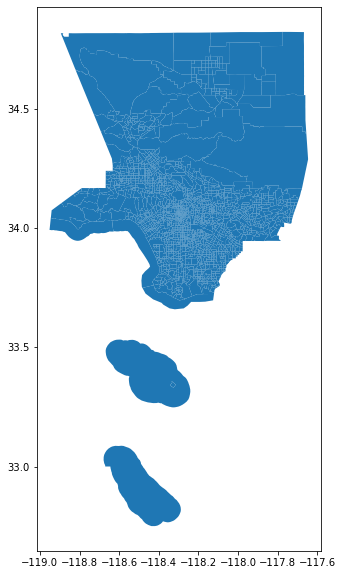

In [28]:
#cut down to what we need - FIPS and gemetry
tract_shape = tract_shape[['name','geometry']]

#rename name column so we don't get confused
tract_shape.columns = ['FIPS','geometry']

#plot census tracts
tract_shape.plot(figsize=(12,10))

### Metro Bus Stops Data

In [29]:
#now let's check out our bus stops
bus.head()

,STOPNUM,LINE,DIR_A2,STOPNAME,LAT,LONG,geometry
0,1,108,E,PARAMOUNT / SLAUSON,33.973248,-118.113113,POINT (-118.11311 33.97325)
1,1,265,S,PARAMOUNT / SLAUSON,33.973248,-118.113113,POINT (-118.11311 33.97325)
2,3,35,N,JEFFERSON / 10TH,34.025471,-118.328402,POINT (-118.32840 34.02547)
3,6,55,N,120TH \ AUGUSTUS F HAWKINS,33.924696,-118.242222,POINT (-118.24222 33.92470)
4,6,120,W,120TH \ AUGUSTUS F HAWKINS,33.924696,-118.242222,POINT (-118.24222 33.92470)


In [30]:
#lots of data, blessedly clean
bus.info

<bound method DataFrame.info of         STOPNUM  LINE DIR_A2                    STOPNAME        LAT  \
0             1   108      E         PARAMOUNT / SLAUSON  33.973248   
1             1   265      S         PARAMOUNT / SLAUSON  33.973248   
2             3    35      N            JEFFERSON / 10TH  34.025471   
3             6    55      N  120TH \ AUGUSTUS F HAWKINS  33.924696   
4             6   120      W  120TH \ AUGUSTUS F HAWKINS  33.924696   
...         ...   ...    ...                         ...        ...   
19061  70500036   770      E                 17TH / HILL  34.034213   
19062  70500039   770      E      CESAR E CHAVEZ / ROWAN  34.040383   
19063  70500041   770      E            GARVEY / DEL MAR  34.062495   
19064  72000002   720      W       WILSHIRE / BARRINGTON  34.049454   
19065  72000003   720      W                6TH / WITMER  34.055547   

             LONG                     geometry  
0     -118.113113  POINT (-118.11311 33.97325)  
1     -118.113113

In [31]:
#rename columns
bus.columns = ['stop_num',
 'line',
 'dir',
 'stop_name',
 'lat',
 'long',
 'geometry']
bus.head()

,stop_num,line,dir,stop_name,lat,long,geometry
0,1,108,E,PARAMOUNT / SLAUSON,33.973248,-118.113113,POINT (-118.11311 33.97325)
1,1,265,S,PARAMOUNT / SLAUSON,33.973248,-118.113113,POINT (-118.11311 33.97325)
2,3,35,N,JEFFERSON / 10TH,34.025471,-118.328402,POINT (-118.32840 34.02547)
3,6,55,N,120TH \ AUGUSTUS F HAWKINS,33.924696,-118.242222,POINT (-118.24222 33.92470)
4,6,120,W,120TH \ AUGUSTUS F HAWKINS,33.924696,-118.242222,POINT (-118.24222 33.92470)


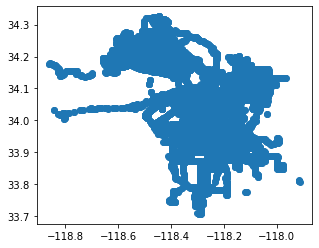

In [32]:
#ensure projection matches other data and check plot
#I can't tell if some of these go out of city limits
#will have to look closer when I start mapping with overlays.
bus=bus.set_crs("EPSG:4326")
bus.crs
bus.plot()

## Adding Geometry to data for plotting

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

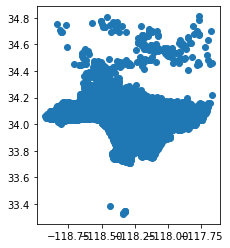

In [38]:
#Now I need to give these parks some geometries to make them mappable
#and eventually able to merge with park shape
g_resources = gpd.GeoDataFrame(
    resources, geometry=gpd.points_from_xy(resources.center_long, resources.center_lat))
resources.plot() 
resources=resources.set_crs("EPSG:4326")
resources.crs

## Narrowing data to desired area

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

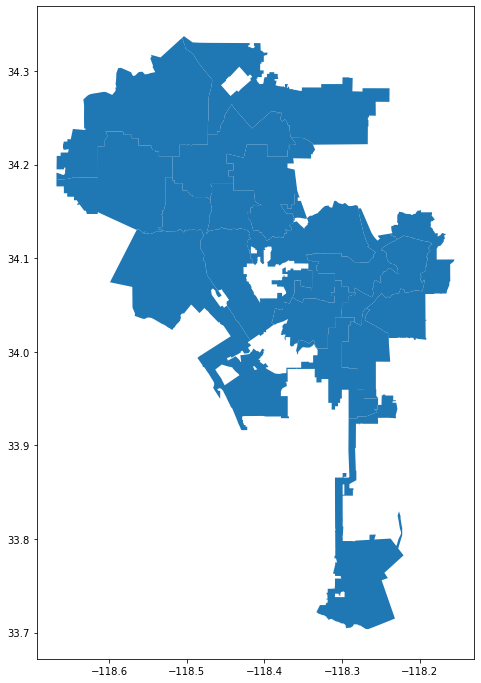

In [39]:
#that worked. Now I need to only include resources within City of LA boundaries.
city.plot(
            figsize=(20,12),
) 
city=city.set_crs("EPSG:4326")
city.crs

In [40]:
city.head()

,kind,external_id,name,slug,set,metadata,resource_uri,geometry
0,L.A. City Council District (2012),10,10,10-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '10'},/1.0/boundary/10-la-city-council-district-2012/,"MULTIPOLYGON (((-118.29166 34.06905, -118.2916..."
1,L.A. City Council District (2012),11,11,11-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '11'},/1.0/boundary/11-la-city-council-district-2012/,"MULTIPOLYGON (((-118.35846 33.98304, -118.3586..."
2,L.A. City Council District (2012),12,12,12-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '12'},/1.0/boundary/12-la-city-council-district-2012/,"MULTIPOLYGON (((-118.46805 34.28553, -118.4692..."
3,L.A. City Council District (2012),13,13,13-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '13'},/1.0/boundary/13-la-city-council-district-2012/,"MULTIPOLYGON (((-118.27834 34.15320, -118.2756..."
4,L.A. City Council District (2012),14,14,14-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '14'},/1.0/boundary/14-la-city-council-district-2012/,"MULTIPOLYGON (((-118.22993 34.12134, -118.2298..."


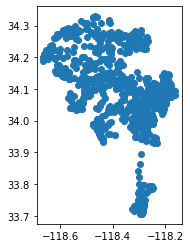

In [41]:
#then use a spatial join to just get the resources within the city area
la_resources = gpd.sjoin(resources, city)
la_resources.plot()

In [42]:
#excellent. but there are some redundancies/unnecessary info again
la_resources.head()

,name_left,access,type,picnic,restroom,center_lat,center_long,geometry,index_right,kind,external_id,name_right,slug,set,metadata,resource_uri
3,El Escorpion Park,Open Access,Community Regional Park,0,0,34.19674178,-118.6641685,POINT (-118.66417 34.19674),2,L.A. City Council District (2012),12,12,12-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '12'},/1.0/boundary/12-la-city-council-district-2012/
33,Garden of the Gods,Open Access,Not Analyzed,0,0,34.27324086,-118.6109988,POINT (-118.61100 34.27324),2,L.A. City Council District (2012),12,12,12-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '12'},/1.0/boundary/12-la-city-council-district-2012/
34,Garden of the Gods Park,Open Access,Community Regional Park,0,0,34.27450879,-118.60171477,POINT (-118.60171 34.27451),2,L.A. City Council District (2012),12,12,12-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '12'},/1.0/boundary/12-la-city-council-district-2012/
50,Gothic Rinaldi Park,Open Access,Not Analyzed,0,0,34.27800621,-118.48130623,POINT (-118.48131 34.27801),2,L.A. City Council District (2012),12,12,12-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '12'},/1.0/boundary/12-la-city-council-district-2012/
51,Granada Hills Park,Open Access,Community Park,1,1,34.26288013,-118.49678632,POINT (-118.49679 34.26288),2,L.A. City Council District (2012),12,12,12-la-city-council-district-2012,/1.0/boundary-set/la-city-council-districts-2012/,{'DISTRICT': '12'},/1.0/boundary/12-la-city-council-district-2012/


In [43]:
#lets clean up with data once more
columns_to_drop = ['center_lat',
                   'center_long',
                   'index_right',
                   'kind',
                   'external_id',
                   'name_right',
                   'slug',
                   'set',
                   'metadata',
                   'resource_uri']
la_resources = la_resources.drop(columns_to_drop,axis=1)
la_resources.columns = ['name',
                     'access',
                     'type',
                     'picnic',
                     'restroom',
                     'geometry']
la_resources.head()

,name,access,type,picnic,restroom,geometry
3,El Escorpion Park,Open Access,Community Regional Park,0,0,POINT (-118.66417 34.19674)
33,Garden of the Gods,Open Access,Not Analyzed,0,0,POINT (-118.61100 34.27324)
34,Garden of the Gods Park,Open Access,Community Regional Park,0,0,POINT (-118.60171 34.27451)
50,Gothic Rinaldi Park,Open Access,Not Analyzed,0,0,POINT (-118.48131 34.27801)
51,Granada Hills Park,Open Access,Community Park,1,1,POINT (-118.49679 34.26288)


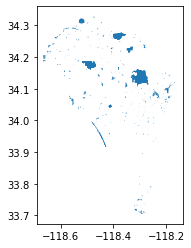

In [44]:
#now let's join these to our park shapefile
park_info = gpd.sjoin(parks_la, la_resources)
park_info.plot()

## Introductory Analysis - Parks

(-118.69379615000001, -118.12964684999997, 33.6719924, 34.3689876)

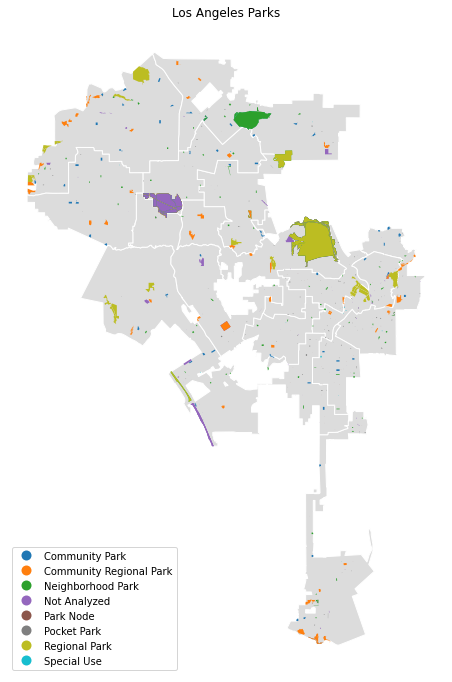

In [45]:
#first let's look at all parks in context
#we'll need a base map to make sense of anything
base=city.plot(figsize=(12,12),color='gainsboro', 
                               edgecolor='white')

ax3 = park_info.plot(ax=base, 
                     column='type',
                     legend=True,
                     legend_kwds={'loc':'lower left'})

# add a title
ax3.set_title('Los Angeles Parks')

# get rid of the axis
ax3.axis('off')

In [142]:
#I should be able to produce the parks per council district chart I was trying to produce earlier now
df7=park_info[['name','cd','type']]
df7['freq'] = df7['name'].map(df7['name'].value_counts())
df7.head()

<ipython-input-142-72dbd0605075>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,name,cd,type,freq
0,Vista Hermosa Soccer Field,1,Special Use,1
1,Ernest E Debs Regional Park,1,Regional Park,1
2,Cleland Avenue Bicentennial Park,1,Pocket Park,1
3,Sycamore Grove Park,1,Community Park,1
5,Normandie Recreation Center,1,Neighborhood Park,1


In [145]:
#here we are - having all info in one dataframe was necessary
chart=px.bar(df7,
       x='cd',
       y='freq',
       labels={'cd':"Council District",'freq':"Number of Parks",'type':"Park Type"},
       color='type',
       title='Park Types per LA City Council District',
       barmode='stack'
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

In [55]:
park_info.head()

,park_id,name_left,shape_area,shape_leng,area_acres,issubpark,address,cd_real,geometry,freq,index_right,name_right,access,type,picnic,restroom
0,471,Vista Hermosa Soccer Field,81856.4316403,1293.65778036,1.87917261403,N,"1301 W 1st St, LA 90026",1,"MULTIPOLYGON (((-118.25717 34.06159, -118.2569...",49,2168,Vista Hermosa Soccer Field,Open Access,Special Use,0,1
1,453,Ernest E Debs Regional Park,13879064.2613,26943.5567173,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879...",49,1003,Ernest E Debs RP,Open Access,Regional Park,2,4
2,65,Cleland Avenue Bicentennial Park,40077.2540351,1363.12458794,0.920050834356,N,"4800 E Cleland Ave, LA 90042",1,"MULTIPOLYGON (((-118.21178 34.11341, -118.2118...",49,1645,Cleland Ave Bicentennial Park,Open Access,Pocket Park,0,0
3,1,Sycamore Grove Park,691462.199493,6227.3991903,15.8738513625,N,"4702 N Figueroa St, LA 90042",1,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011...",49,1005,Sycamore Grove Park,Open Access,Community Park,1,1
5,175,Normandie Recreation Center,142508.174306,1575.55772808,3.27155060469,N,"1550 S Normandie Ave, LA 90006",1,"MULTIPOLYGON (((-118.30014 34.04536, -118.2992...",49,288,Normandie Playground,Open Access,Neighborhood Park,0,0


In [56]:
#excellent. again, let's keep it clean.
columns_to_drop = ['park_id',
                   'index_right',
                    'name_right',
                    'shape_leng']
park_info = park_info.drop(columns_to_drop,axis=1)
park_info.columns = ['name',
                     'park_area',
                     'park_acres',
                     'issubpark',
                     'address',
                     'cd',
                     'geometry',
                     'parks_in_cd',
                     'access',
                     'type',
                     'picnic',
                     'restroom'
                       ]
park_info.head()

,name,park_area,park_acres,issubpark,address,cd,geometry,parks_in_cd,access,type,picnic,restroom
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026",1,"MULTIPOLYGON (((-118.25717 34.06159, -118.2569...",49,Open Access,Special Use,0,1
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879...",49,Open Access,Regional Park,2,4
2,Cleland Avenue Bicentennial Park,40077.2540351,0.920050834356,N,"4800 E Cleland Ave, LA 90042",1,"MULTIPOLYGON (((-118.21178 34.11341, -118.2118...",49,Open Access,Pocket Park,0,0
3,Sycamore Grove Park,691462.199493,15.8738513625,N,"4702 N Figueroa St, LA 90042",1,"MULTIPOLYGON (((-118.20110 34.10134, -118.2011...",49,Open Access,Community Park,1,1
5,Normandie Recreation Center,142508.174306,3.27155060469,N,"1550 S Normandie Ave, LA 90006",1,"MULTIPOLYGON (((-118.30014 34.04536, -118.2992...",49,Open Access,Neighborhood Park,0,0


In [57]:
#note the "is subpark" category
#are many parks subparks?
chart=px.bar(park_info,
       x='issubpark',
       labels={'type':"Park Type",'count':"Number of Parks"},
       title='Los Angeles Park Types',
       barmode='group'
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

In [58]:
#we want to avoid overlapping geometries where possible
#so it makes sense to eliminate subparks
park_info=park_info[park_info['issubpark']=="N"]
park_info.describe

<bound method NDFrame.describe of                                  name      park_area      park_acres  \
0          Vista Hermosa Soccer Field  81856.4316403   1.87917261403   
1         Ernest E Debs Regional Park  13879064.2613   318.620747882   
2    Cleland Avenue Bicentennial Park  40077.2540351  0.920050834356   
3                 Sycamore Grove Park  691462.199493   15.8738513625   
5         Normandie Recreation Center  142508.174306   3.27155060469   
..                                ...            ...             ...   
551          Grape Street Pocket Park  5203.85467587   0.11946454296   
552              San Pedro Plaza Park  152749.805211   3.50666703884   
553                         Alma Park  98617.0939395    2.2639460149   
554                         Peck Park  3246101.37868   74.5205317523   
556       Los Angeles Maritime Museum  107971.798241   2.47870133447   

    issubpark                                            address  cd  \
0           N                

In [59]:
#what types of parks are common?
chart=px.bar(park_info,
       x='type',
       labels={'type':"Park Type",'count':"Number of Parks"},
       title='Los Angeles Park Types',
       barmode='group'
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

In [60]:
#do more have open or not open access?
chart=px.bar(park_info,
       x='access',
       labels={'access':"Access to Park",'count':"Number of Parks"},
       title='Los Angeles Park Accessibility',
       barmode='group'
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

## Identifying Encampments by Census Tract

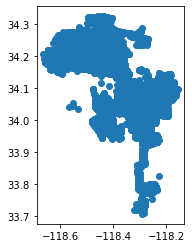

In [101]:
#first add geometry to encampments
g_encamp_19 = gpd.GeoDataFrame(
    encamp_19, geometry=gpd.points_from_xy(encamp_19.long, encamp_19.lat))
encamp_19.plot() 

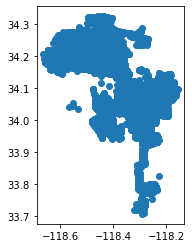

In [62]:
#then match crs
encamp_19=encamp_19.set_crs("EPSG:4326")
encamp_19.crs
encamp_19.plot() 

In [63]:
#now I want to merge encampment reports with census tract shapes
#This duplicates parks to reflect the # encampments reported within
tract_encamp = gpd.sjoin(tract_shape, encamp_19)
tract_encamp['freq'] = tract_encamp['FIPS'].map(tract_encamp['FIPS'].value_counts())
tract_encamp.head()

,FIPS,geometry,index_right,created,loc_verified,approx_loc,lat,long,apc,cd,cd_member,nc,nc_name,precinct,freq
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",43228,6/10/2019 22:02,Y,N,34.25969981,-118.2912544,North Valley APC,7,Monica Rodriguez,10,SUNLAND-TUJUNGA NC,FOOTHILL,7
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",43071,4/10/2019 8:15,Y,N,34.2575196,-118.2998249,North Valley APC,7,Monica Rodriguez,10,SUNLAND-TUJUNGA NC,FOOTHILL,7
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",43070,4/10/2019 7:59,Y,N,34.2575196,-118.2998249,North Valley APC,7,Monica Rodriguez,10,SUNLAND-TUJUNGA NC,FOOTHILL,7
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",43111,4/16/2019 19:11,Y,,34.25775598,-118.3011203,North Valley APC,7,Monica Rodriguez,10,SUNLAND-TUJUNGA NC,FOOTHILL,7
0,06037101110,"MULTIPOLYGON (((-118.30229 34.25870, -118.3007...",43110,4/14/2019 13:40,Y,,34.25775598,-118.3011203,North Valley APC,7,Monica Rodriguez,10,SUNLAND-TUJUNGA NC,FOOTHILL,7


In [64]:
#now dissolve to get rid of the endless repeats
tract_encamp_diss = tract_encamp.dissolve(by='FIPS')
tract_encamp_diss = tract_encamp_diss.reset_index()

(-118.69379615000001, -118.12964684999997, 33.6719924, 34.3689876)

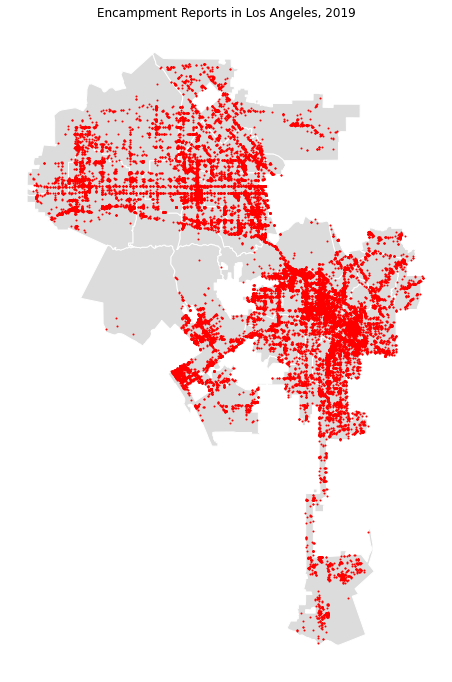

In [65]:
#first let's look at all encampment reports
#we'll need a base map to make sense of anything
base=city.plot(figsize=(12,12),color='gainsboro', edgecolor='white')
ax = encamp_19.plot(ax=base, color='red', markersize=1)

# add a title
ax.set_title('Encampment Reports in Los Angeles, 2019')

# get rid of the axis
ax.axis('off')

(-118.69380655, -118.12964844999999, 33.66468695, 34.373880050000004)

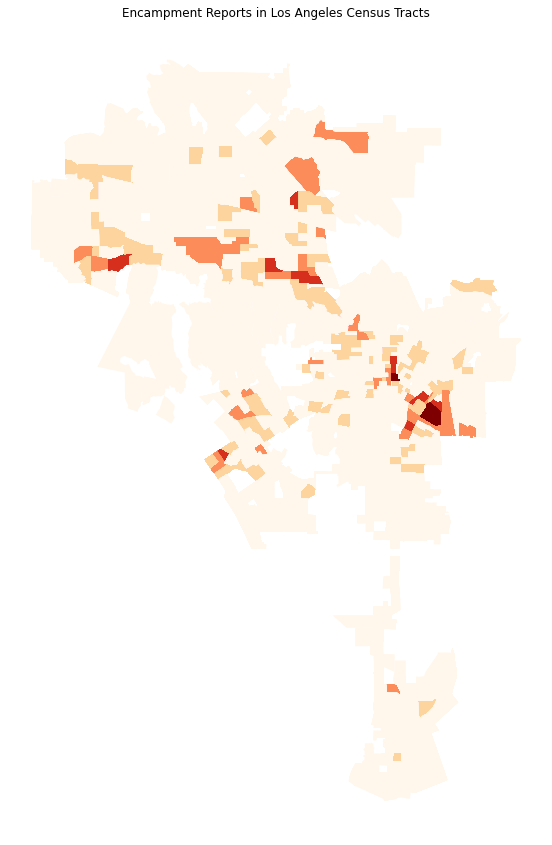

In [66]:
#then, we can look by census tracts
ax1 = tract_encamp.plot(figsize=(20,15),
                 column='freq',
                 legend=False, 
                 cmap="OrRd",
                 scheme='NaturalBreaks',
                 legend_kwds={'loc':'lower left'})

ax1.set_title('Encampment Reports in Los Angeles Census Tracts')

ax1.axis('off')

/opt/conda/lib/python3.8/site-packages/geopandas/plotting.py:572: UserWarning:

Only specify one of 'column' or 'color'. Using 'color'.



(-118.69380655, -118.12964844999999, 33.66468695, 34.373880050000004)

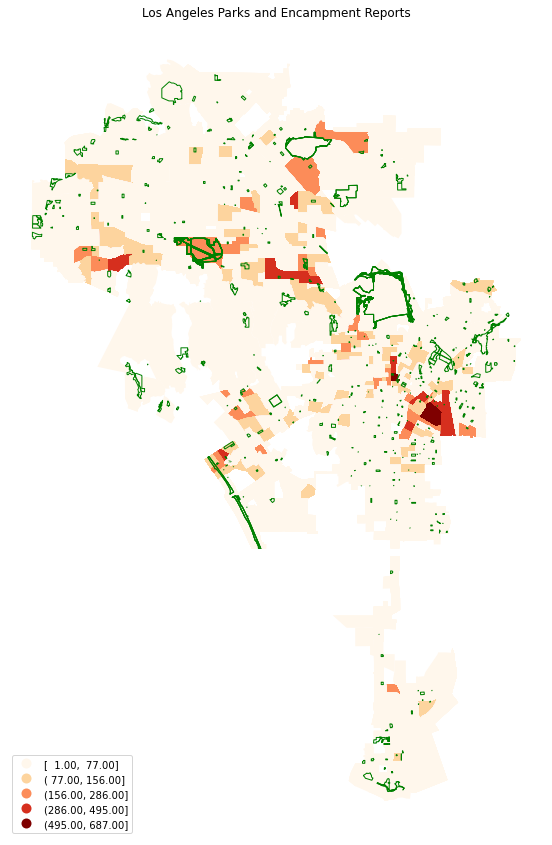

In [67]:
#then we can overlay the parks
base = tract_encamp.plot(figsize=(20,15),
                 column='freq',
                 legend=True, 
                 cmap="OrRd",
                 scheme='NaturalBreaks',
                 legend_kwds={'loc':'lower left'})

ax2=park_info.plot(ax=base,
                 color='none', 
                 edgecolor='green',            
                 column='freq',
                 legend=False 
                            );
ax2.set_title('Los Angeles Parks and Encampment Reports')

ax2.axis('off')

Now we see tracts where encampments were reported in the City of LA.

Some things stand out: Downtown and the Sepulveda Basin are not surprising given Skid Row and the number of fires in Sepulveda Basin. However, the Lakeview Terrace, Chatsworth Resevoir, and Eagle Rock areas are less expected.

In [68]:
#since we have been using council district info elsewhere
#may be helpful to see here 
#join encampment data with CD data
cd_encamp = gpd.sjoin(city, encamp_19)
cd_encamp['freq'] = cd_encamp['name'].map(cd_encamp['name'].value_counts())

In [69]:
#now dissolve to get rid of the endless repeats
cd_encamp = cd_encamp.dissolve(by='name')
cd_encamp = cd_encamp.reset_index()

(-118.69379615, -118.12964685, 33.6719924, 34.3689876)

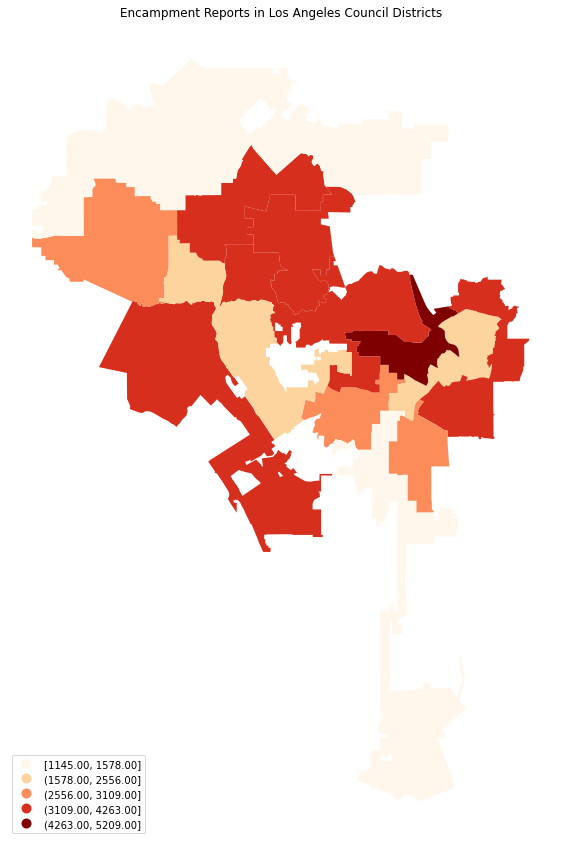

In [70]:
#and plot by council district
ax1 = cd_encamp.plot(figsize=(20,15),
                 column='freq',
                 legend=True, 
                 cmap="OrRd",
                 scheme='NaturalBreaks',
                 legend_kwds={'loc':'lower left'})

# add a title
ax1.set_title('Encampment Reports in Los Angeles Council Districts')

# get rid of the axis
ax1.axis('off')

## Identify Encampments in Parks

In [71]:
#now we have park name, address, council district, type, access, and restrooms
#in one dataframe
#now I want to merge encampment reports with park shapes and information
#This duplicates parks to reflect the # encampments reported within
park_encamp_ex = gpd.sjoin(park_info, encamp_19)
park_encamp_ex.head()

,name,park_area,park_acres,issubpark,address,cd_left,geometry,parks_in_cd,access,type,...,approx_loc,lat,long,apc,cd_right,cd_member,nc,nc_name,precinct,freq
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879...",49,Open Access,Regional Park,...,Y,34.1016906,-118.1978547,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,HOLLENBECK,2558
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879...",49,Open Access,Regional Park,...,,34.1016906,-118.1978547,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,HOLLENBECK,2558
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879...",49,Open Access,Regional Park,...,N,34.10381412,-118.1908148,East Los Angeles APC,1,Gilbert Cedillo,41,HISTORIC HIGHLAND PARK NC,HOLLENBECK,2558
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879...",49,Open Access,Regional Park,...,N,34.09757812,-118.2014555,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,HOLLENBECK,2558
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"MULTIPOLYGON (((-118.18803 34.10388, -118.1879...",49,Open Access,Regional Park,...,N,34.09757812,-118.2014555,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,HOLLENBECK,2558


In [72]:
#that duplication doesn't help us, so let's add frequency
park_encamp_ex['freq'] = park_encamp_ex['name'].map(park_encamp_ex['name'].value_counts())

In [73]:
#and dissolve, so that we only have 1 row per park
park_encamp_dissex = park_encamp_ex.dissolve(by='name')

In [74]:
#we also need to reset the index, and sort by something that will show us this worked
park_encamp_dissex = park_encamp_dissex.reset_index()
park_encamp_dissex=park_encamp_dissex.sort_values(by='name',ascending = True)
park_encamp_dissex

,name,geometry,park_area,park_acres,issubpark,address,cd_left,parks_in_cd,access,type,...,approx_loc,lat,long,apc,cd_right,cd_member,nc,nc_name,precinct,freq
0,Angels Gate Park,"POLYGON ((-118.29271 33.71301, -118.29270 33.7...",3068532.21578,70.4440883827,N,"3601 S Gaffey St, San Pedro 90731",15,49,Open Access,Community Regional Park,...,N,33.71148326,-118.2930027,Harbor APC,15,Joe Buscaino,96,COASTAL SAN PEDRO NC,HARBOR,2
1,Arroyo Seco Park,"MULTIPOLYGON (((-118.18504 34.10551, -118.1851...",3792749.70542,87.0699007453,N,"5568 E Via Marisol, LA 90042",14,54,Open Access,Community Regional Park,...,,34.11061526,-118.1802165,East Los Angeles APC,14,Jose Huizar,41,HISTORIC HIGHLAND PARK NC,HOLLENBECK,3
2,Barnsdall Park,"POLYGON ((-118.29298 34.09930, -118.29298 34.0...",635668.513242,14.5929994473,N,"4800 W Hollywood Blvd, LA 90027",13,35,Open Access,Community Park,...,,34.10151695,-118.2944837,Central APC,13,Mitch O'Farrell,36,LOS FELIZ NC,NORTHEAST,10
3,Benny H Potter West Adams Avenues Memorial Park,"POLYGON ((-118.31946 34.03445, -118.31994 34.0...",70645.0386299,1.62179341623,N,"2413 S 2nd Ave, LA 90018",10,24,Open Access,Pocket Park,...,,34.03457994,-118.3190905,South Los Angeles APC,10,Herb J. Wesson Jr.,74,UNITED NEIGHBORHOODS OF THE HISTORIC ARLINGTON...,SOUTHWEST,1
4,Brand Park,"POLYGON ((-118.45569 34.27260, -118.45563 34.2...",771453.397194,17.747597775,N,"15174 W San Fernando Mission Rd, Mission Hills...",7,38,Open Access,Community Park,...,,34.27207928,-118.4610825,North Valley APC,7,Monica Rodriguez,101,MISSION HILLS NC,MISSION,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
94,Wilacre Park,"POLYGON ((-118.40317 34.13826, -118.40316 34.1...",5450855.53773,125.134925189,N,"S of Maxwell Fire Rd; 12601 Mulholland Dr, Stu...",2,33,Open Access,Regional Park,...,N,34.13345206,-118.3917442,South Valley APC,2,Paul Krekorian,27,STUDIO CITY NC,NORTH HOLLYWOOD,3
95,Winnetka Recreation Center,"POLYGON ((-118.57120 34.22175, -118.57120 34.2...",694684.703837,15.9478301787,N,"8401 N Winnetka Ave, Winnetka 91306",3,21,Open Access,Community Park,...,,34.22139302,-118.5712714,North Valley APC,3,Bob Blumenfield,14,WINNETKA NC,DEVONSHIRE,5
96,Woodbridge Park,"POLYGON ((-118.37460 34.14856, -118.37460 34.1...",205047.436648,4.70726025805,N,"11240 W Moorpark St, Studio City 91602",2,33,Open Access,Neighborhood Park,...,,34.15018104,-118.3765292,South Valley APC,2,Paul Krekorian,27,STUDIO CITY NC,NORTH HOLLYWOOD,1
97,York Blvd Pocket Park,"POLYGON ((-118.20707 34.12131, -118.20714 34.1...",12788.6660416,0.293588549046,N,"4948-4956 E York Blvd, LA 90042",14,54,Open Access,Pocket Park,...,,34.12132717,-118.2073718,East Los Angeles APC,14,Jose Huizar,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,2


In [75]:
#it's important to think back to the encampment data
#Over 44% of encampment addresses were estimated
#Especially since parks can be hard to find an address for
#Let's create a 1/2 block radius buffer
park_info['geometry']=park_info.geometry.buffer(.001)

<ipython-input-75-7f6c5ab05763>:5: UserWarning:

Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.




In [76]:
#and create another spatial join to reflect the buffering
park_encamp = gpd.sjoin(park_info, encamp_19)
park_encamp.head()

,name,park_area,park_acres,issubpark,address,cd_left,geometry,parks_in_cd,access,type,...,approx_loc,lat,long,apc,cd_right,cd_member,nc,nc_name,precinct,freq
0,Vista Hermosa Soccer Field,81856.4316403,1.87917261403,N,"1301 W 1st St, LA 90026",1,"POLYGON ((-118.25821 34.06040, -118.25828 34.0...",49,Open Access,Special Use,...,N,34.06169109,-118.2584893,Central APC,1,Gilbert Cedillo,44,GREATER ECHO PARK ELYSIAN NC,RAMPART,2558
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"POLYGON ((-118.20267 34.09942, -118.20267 34.0...",49,Open Access,Regional Park,...,Y,34.1016906,-118.1978547,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,HOLLENBECK,2558
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"POLYGON ((-118.20267 34.09942, -118.20267 34.0...",49,Open Access,Regional Park,...,,34.1016906,-118.1978547,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,HOLLENBECK,2558
1,Ernest E Debs Regional Park,13879064.2613,318.620747882,N,"4235 N Monterey Rd, LA 90032",1,"POLYGON ((-118.20267 34.09942, -118.20267 34.0...",49,Open Access,Regional Park,...,,34.10171405,-118.2013037,East Los Angeles APC,1,Gilbert Cedillo,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,2558
3,Sycamore Grove Park,691462.199493,15.8738513625,N,"4702 N Figueroa St, LA 90042",1,"POLYGON ((-118.20579 34.09726, -118.20581 34.0...",49,Open Access,Community Park,...,,34.10171405,-118.2013037,East Los Angeles APC,1,Gilbert Cedillo,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,2558


In [77]:
#and as before, adjust the spatial join for the buffered parks
#that duplication doesn't help us, so let's add frequency
park_encamp['freq'] = park_encamp['name'].map(park_encamp['name'].value_counts())

#and dissolve, so that we only have 1 row per park
park_encamp_diss = park_encamp.dissolve(by='name')

#we also need to reset the index, and sort by something that will show us this worked
park_encamp_diss = park_encamp_diss.reset_index()
park_encamp_diss=park_encamp_diss.sort_values(by='name',ascending = True)
park_encamp_diss

,name,geometry,park_area,park_acres,issubpark,address,cd_left,parks_in_cd,access,type,...,approx_loc,lat,long,apc,cd_right,cd_member,nc,nc_name,precinct,freq
0,1st And Broadway Civic Center Park (TBD),"POLYGON ((-118.24549 34.05495, -118.24542 34.0...",85532.956018,1.96357433772,N,"217 W 1st St, LA 90012",14,54,Open Access,Pocket Park,...,N,34.05292846,-118.2444975,Central APC,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,34
1,49th Street Pocket Park,"POLYGON ((-118.26344 33.99957, -118.26334 33.9...",8250.43763411,0.189404743709,N,"670 E 49Th St, LA 90011",9,34,Open Access,Park Node,...,N,33.9984056,-118.2645197,South Los Angeles APC,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,2
2,6th & Gladys Street Park,"POLYGON ((-118.24165 34.03942, -118.24170 34.0...",14823.490385,0.340301875096,N,"624 E 6th Street, LA 90021",14,54,Open Access,Pocket Park,...,N,34.04004454,-118.2421345,Central APC,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,37
3,76th Street Pocket Park,"POLYGON ((-118.28833 33.96982, -118.28843 33.9...",5591.97634123,0.128374626015,N,"833 W 76th St, LA 90044",8,26,Open Access,Park Node,...,N,33.97051712,-118.2880114,South Los Angeles APC,8,Marqueece Harris-Dawson,123,UNITED FOR VICTORY,77TH STREET,2
4,Albert Piantanida Intergenerational Center,"POLYGON ((-118.44815 34.24514, -118.44805 34.2...",115992.665239,2.66283584046,N,"9540 N Van Nuys Blvd, Panorama City 91402",6,28,Restricted Access,Pocket Park,...,,34.24265591,-118.4502828,North Valley APC,6,Nury Martinez,100,PANORAMA CITY NC,MISSION,11
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
271,Woodbridge Park,"POLYGON ((-118.37770 34.14885, -118.37770 34.1...",205047.436648,4.70726025805,N,"11240 W Moorpark St, Studio City 91602",2,33,Open Access,Neighborhood Park,...,,34.15018104,-118.3765292,South Valley APC,2,Paul Krekorian,27,STUDIO CITY NC,NORTH HOLLYWOOD,55
272,Woodland Hills Recreation Center,"POLYGON ((-118.61386 34.17465, -118.61438 34.1...",817168.061747,18.7596724157,N,"5858 N Shoup Ave, Woodland Hills 91367",3,21,Open Access,Community Park,...,,34.17471315,-118.6127447,South Valley APC,3,Bob Blumenfield,16,WOODLAND HILLS-WARNER CENTER NC,TOPANGA,3
273,Woodside Triangle,"POLYGON ((-118.20650 34.09950, -118.20641 34.0...",7562.9668937,0.173622524005,N,Woodside Dr & Marmion Way,1,49,Open Access,Not Analyzed,...,N,34.09815761,-118.2054158,East Los Angeles APC,1,Gilbert Cedillo,42,ARROYO SECO NC,NORTHEAST,4
274,York Blvd Pocket Park,"POLYGON ((-118.20610 34.12106, -118.20611 34.1...",12788.6660416,0.293588549046,N,"4948-4956 E York Blvd, LA 90042",14,54,Open Access,Pocket Park,...,,34.12132717,-118.2073718,East Los Angeles APC,14,Jose Huizar,41,HISTORIC HIGHLAND PARK NC,NORTHEAST,2


In [78]:
park_encamp_diss.columns

Index(['name', 'geometry', 'park_area', 'park_acres', 'issubpark', 'address',
       'cd_left', 'parks_in_cd', 'access', 'type', 'picnic', 'restroom',
       'index_right', 'created', 'loc_verified', 'approx_loc', 'lat', 'long',
       'apc', 'cd_right', 'cd_member', 'nc', 'nc_name', 'precinct', 'freq'],
      dtype='object')

In [79]:
#some columns are not accurate anymore
#like encampment details, since we dissolved
#time to clean some more!
columns_to_drop = ['cd_left',
                   'index_right',
                   'created',
                    'loc_verified',
                    'approx_loc',
                    'lat',
                    'long',
                    'apc'
                        ]
park_encamp_diss = park_encamp_diss.drop(columns_to_drop,axis=1)
park_encamp_diss.columns = ['name',
                     'geometry',
                     'park_area',
                     'park_acres',
                     'issubpark',
                     'address',
                     'parks_in_cd',
                     'access',
                     'type',
                     'picnic',
                     'restroom',
                     'cd',
                     'cd_member',
                     'nc',
                     'nc_name',
                     'precinct',
                     'freq'
                       ]
park_encamp_diss.head()

,name,geometry,park_area,park_acres,issubpark,address,parks_in_cd,access,type,picnic,restroom,cd,cd_member,nc,nc_name,precinct,freq
0,1st And Broadway Civic Center Park (TBD),"POLYGON ((-118.24549 34.05495, -118.24542 34.0...",85532.956018,1.96357433772,N,"217 W 1st St, LA 90012",54,Open Access,Pocket Park,0,0,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,34
1,49th Street Pocket Park,"POLYGON ((-118.26344 33.99957, -118.26334 33.9...",8250.43763411,0.189404743709,N,"670 E 49Th St, LA 90011",34,Open Access,Park Node,0,0,9,Curren D. Price Jr.,125,ZAPATA KING NC,NEWTON,2
2,6th & Gladys Street Park,"POLYGON ((-118.24165 34.03942, -118.24170 34.0...",14823.490385,0.340301875096,N,"624 E 6th Street, LA 90021",54,Open Access,Pocket Park,1,0,14,Jose Huizar,52,DOWNTOWN LOS ANGELES,CENTRAL,37
3,76th Street Pocket Park,"POLYGON ((-118.28833 33.96982, -118.28843 33.9...",5591.97634123,0.128374626015,N,"833 W 76th St, LA 90044",26,Open Access,Park Node,2,0,8,Marqueece Harris-Dawson,123,UNITED FOR VICTORY,77TH STREET,2
4,Albert Piantanida Intergenerational Center,"POLYGON ((-118.44815 34.24514, -118.44805 34.2...",115992.665239,2.66283584046,N,"9540 N Van Nuys Blvd, Panorama City 91402",28,Restricted Access,Pocket Park,0,0,6,Nury Martinez,100,PANORAMA CITY NC,MISSION,11


## Park Based Encampment Analysis

In [80]:
#Let's see what parks have the most and least encampment reports
#and how many encampments in parks were reported overall
#now we can see the 2019 report hot spots in terms of parks
#Only 2.5% of encampment reports were in park areas
print(str(len(park_encamp_ex)) + ' encapments were reported in parks')
print(str(len(park_encamp_ex)/(len(encamp_19))*100) + '% Encampment Reports were for park areas')

park_encamp_dissex=park_encamp_dissex.sort_values(by='freq',ascending = False)
park_encamp_dissex[['name','freq']]

1102 encapments were reported in parks
2.4717941816387414% Encampment Reports were for park areas


,name,freq
70,Sepulveda Basin Recreation Area,390
24,Hansen Dam Recreation Area,135
73,Shatto Recreation Center,58
86,Venice Beach,54
23,Griffith Park,50
...,...,...
34,Las Palmas Senior Citizen Center,1
31,Jackie Tatum / Harvard Recreation Center,1
29,Hoover Recreation Center,1
28,Holmby Park,1


In [81]:
#the differences with a buffer added are significant
print(str(len(park_encamp)) + ' encapments were reported in or near parks')
print(str(len(park_encamp)/(len(encamp_19))*100) + '% Encampment Service Requests were for park areas')

park_encamp_diss=park_encamp_diss.sort_values(by='freq',ascending = False)
park_encamp_diss[['name','freq']]

6736 encapments were reported in or near parks
15.108898010452416% Encampment Service Requests were for park areas


,name,freq
207,Sepulveda Basin Recreation Area,2030
95,Hansen Dam Recreation Area,365
211,Shatto Recreation Center,320
92,Griffith Park,270
247,Venice Beach,172
...,...,...
61,East Wilmington Greenbelt Community Center,1
63,El Dorado Avenue Park,1
64,El Escorpion Park,1
66,El Sereno Arroyo Playground,1


In [82]:
#how much of a difference do buffers make?
print('A 1/2 block buffer captures '+(str(len(park_encamp)-(len(park_encamp_ex)))) + ' more encampment reports')
print('This reflects a '+(str((len(park_encamp)-(len(park_encamp_ex)))/(len(park_encamp_ex))*100)) + ' % increase in reports')

A 1/2 block buffer captures 5634 more encampment reports
This reflects a 511.2522686025408 % increase in reports


In [83]:
#interactive map
m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

#sorting by number of encampments
choropleth = folium.Choropleth(
    geo_data = park_encamp_diss,
    name = 'choropleth',
    data = park_encamp_diss,
    columns = ['name', 'freq'],
    key_on = 'feature.properties.name',
    fill_color = 'BuPu',
    line_weight = 0.5,
    fill_opacity = 0.5,
    line_opacity = 0.5,
    legend_name = 'Parks by Concentration of LA 311 Encampment Service Requests, 2019',
    highlight = True
).add_to(m)

#adding tooltip
choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name','freq'],
                                   labels=True,
                                   aliases=['Park Name: ','Encampment Reports: ']
                                  )
)

#adding popups
choropleth.geojson.add_child(
    folium.features.GeoJsonPopup(['name','type','freq','cd','park_acres','address'], 
                                 labels=True,
                                 aliases=['Park Name: ','Park Type: ','Reports: ','Council District: ','Acreage: ','Address: '])
)

m

In [84]:
m.save('LA_Parks_w_Encampment_Reports_2019.html')

In [85]:
#It's important to see the enormous amount of requests from Sepulveda Basin
#But at the same time it throws off our entire map because it's such an outlier
#So let's also look at a map that removes that outlier
#And looks at parks with 5 or more encampment

park_encamp_limit=park_encamp_diss[park_encamp_diss['freq']<=1000]
park_encamp_limit=park_encamp_limit[park_encamp_limit['freq']>=5]

m = folium.Map(location=[34.2,-118.2], 
               zoom_start = 9,
               tiles='CartoDB positron', 
               attribution='CartoDB')

#lets try to sort by size
choropleth = folium.Choropleth(
    geo_data = park_encamp_limit,
    name = 'choropleth',
    data = park_encamp_limit,
    columns = ['name', 'freq'],
    key_on = 'feature.properties.name',
    fill_color = 'BuPu',
    line_weight = 0.5,
    fill_opacity = 0.8,
    line_opacity = 0.5,
    legend_name = 'Parks by Concentration of LA 311 Encampment Reports, 2019',
    highlight = True
).add_to(m)

choropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['name','freq'],
                                   labels=True,
                                   aliases=['Park Name: ','Reports: ']
                                  )
)

choropleth.geojson.add_child(
    folium.features.GeoJsonPopup(['name','type','freq','cd','park_acres','address'], 
                                 labels=True,
                                 aliases=['Park Name: ','Park Type: ','Reports: ','Council District: ','Acreage: ','Address: '])
)

m

In [86]:
m.save('LA_Parks_w_Encampment_Reports_2019_no outlier.html')

## Do Council Districts with more parks also have more park-based encampment reports?

**Conclusion** There does not seem to be a correlation between number of parks in a Council District and number of park-based encampment reports.

In [87]:
#I'm curious if council districts with more parks 
#also have more park-based encapment reports
#let's create a new variable to graph it
df=park_encamp_diss[['cd','parks_in_cd','freq']]
df

,cd,parks_in_cd,freq
207,6,28,2030
95,7,38,365
211,13,35,320
92,4,41,270
247,11,50,172
...,...,...,...
61,15,49,1
63,7,38,1
64,12,47,1
66,14,54,1


In [88]:
#to get a grouped bar chart we need to squish some data together
df=pd.melt(df,id_vars=['cd'],var_name='type',value_name='count')
df

,cd,type,count
0,6,parks_in_cd,28
1,7,parks_in_cd,38
2,13,parks_in_cd,35
3,4,parks_in_cd,41
4,11,parks_in_cd,50
...,...,...,...
547,15,freq,1
548,7,freq,1
549,12,freq,1
550,14,freq,1


In [89]:
#nope, there does not seem to be a relationship
chart=px.bar(df,
       x='cd',
       color="type",
       y='count',
       title='LA Council Districts by Number of Parks and Park Based Encampment Reports',
       barmode='group',
       labels={'cd':"Council District",'parks_in_cd':"Parks",'count':"Value",'freq':"Encampment Reports"}
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

## Do Council Districts with a greater park area also have more park-based encampment reports?

**Conclusion** There does not seem to be a correlation between overall area of parks in a Council District and number of park-based encampment reports.

In [90]:
#what about, instead of number of parks, if council districts with greater
#park area have a greater number of reports in parks
df2=park_encamp_diss[['cd','park_acres','freq']]
df2

,cd,park_acres,freq
207,6,1538.60257364,2030
95,7,1449.54516164,365
211,13,5.45390968817,320
92,4,4282.66874049,270
247,11,160.753175975,172
...,...,...,...
61,15,0.8504663348,1
63,7,1.17752202693,1
64,12,61.2856963373,1
66,14,1.26612999154,1


In [91]:
#again, squish some data
df2=pd.melt(df2,id_vars=['cd'],var_name='type',value_name='count')
df2

,cd,type,count
0,6,park_acres,1538.60257364
1,7,park_acres,1449.54516164
2,13,park_acres,5.45390968817
3,4,park_acres,4282.66874049
4,11,park_acres,160.753175975
...,...,...,...
547,15,freq,1
548,7,freq,1
549,12,freq,1
550,14,freq,1


In [92]:
#there is definitely more correlation here
#but not in each case - district 4 is a noteable outlier
chart=px.bar(df2,
       x='cd',
       labels={'cd':"Council District",'park_acres':"park acreage",'count':"Value",'freq':"Encampment Reports"},
       color="type",
       y='count',
       title='LA Council Districts by Park Acreage and Park Based Encampment Reports',
       barmode='group'
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

### Do parks with a larger acreage have more encampment reports?

**Conclusion** There is not a significant correlation between park acreage and encampment reports

In [93]:
park_encamp_diss['park_acres'] = park_encamp_diss['park_acres'].astype(float)
df6=park_encamp_diss[['park_acres','freq']]
df6

,park_acres,freq
207,1538.602574,2030
95,1449.545162,365
211,5.453910,320
92,4282.668740,270
247,160.753176,172
...,...,...
61,0.850466,1
63,1.177522,1
64,61.285696,1
66,1.266130,1


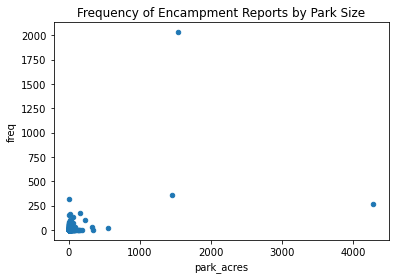

In [94]:
#it seems like there may not be a correlation
#but it's hard to tell because a few outliers are really throwing us off.
df6.plot.scatter(x='park_acres', 
                 y='freq',
                 title="Frequency of Encampment Reports by Park Size")

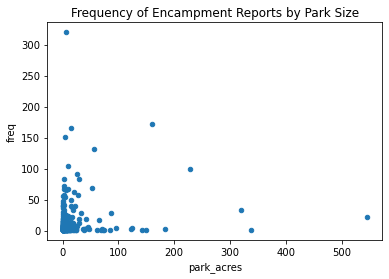

In [95]:
#Let's only look at parks under 1000 acres
df6=df6[df6['park_acres']<=1000]
df6.plot.scatter(x='park_acres', 
                 y='freq',
                 title="Frequency of Encampment Reports by Park Size")

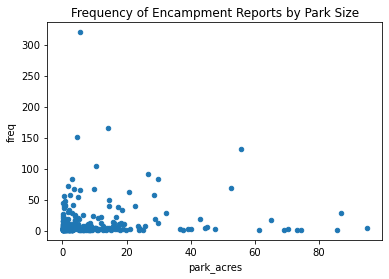

In [96]:
#And only under 100
#Yep, no strong correlation
df6=df6[df6['park_acres']<=100]
df6.plot.scatter(x='park_acres', 
                 y='freq',
                 title="Frequency of Encampment Reports by Park Size")

### Do certain types of parks recieve more encampment reports than others?
***Park Node*** A park of 1/4 acre or less

***Pocket Park*** A park of less than 3 acres

***Neighborhood Park*** A park of 3 - 10 acres

***Community Park*** A park of 10 - 20 acres

***Regional Park*** 10-20 acres. Community parks that are located in residential neighborhoods serve both the needs of the community park service radius and neighborhood park service radius. The amenities programmed into a community park are focused on meeting the needs of several neighborhoods or large sections of the community

***Community Regional Park*** 20-100 acres. Community regional parks protect and conserve natural resources, preserve open spaces, and provide recreational facilities that are not available in neighborhood or community parks

**Conclusion** Yes, there does seem to be a relationship, particularly with Neighborhood and Community Regional Parks

In [97]:
#do certain types of parks recieve more encampment reports than others?
df3=park_encamp_diss[['type','freq']]
df3

,type,freq
207,Community Regional Park,2030
95,Not Analyzed,365
211,Neighborhood Park,320
92,Not Analyzed,270
247,Neighborhood Park,172
...,...,...
61,Pocket Park,1
63,Pocket Park,1
64,Community Regional Park,1
66,Pocket Park,1


In [98]:
chart=px.bar(df3,
       x='type',
       labels={'type':"Park Type",'freq':"Encampment Reports"},
       color="type",
       y='freq',
       title='Los Angeles Park Based Encampment Reports by Park Type',
       barmode='group'
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

### Do parks with restrooms have more encampment reports?
It's important to note that the number of restrooms doesn't refer to the number of toilets/stalls, but rather to the number of restroom structures - LA needs more fine grain data!

**Conclusion** Less encampments were reported in parks with restrooms.
There may be a few reasons for this:
1. More restrooms = more investment, often accompanied with more policing. In these areas, police may be actively hostile towards unhoused folks or simply convey a sense of unwelcome.
2. Alternatively, we can consider that sanitation complaints is one reason why many encampments are reported. Encampments with more access to resources like restrooms may placate neighbors.
3. Many park based restrooms close in the evening, so would not be usable for encampment residents anyway, therefore may not be considered a notable amenity

In [99]:
#trim down to just what we need
df4=park_encamp_diss[['restroom','freq']]
df4

,restroom,freq
207,0,2030
95,0,365
211,1,320
92,0,270
247,0,172
...,...,...
61,0,1
63,0,1
64,0,1
66,0,1


In [100]:
chart=px.bar(df4,
       x='restroom',
       labels={'type':"Park Type",'freq':"Encampment Reports",'restroom':"Number of Restroom Facilities"},
       y='freq',
       title='Park Based Encampment Reports by Number of Restroom Facilities',
       barmode='group'
      )
chart.update_layout(
    xaxis = dict(
        tickmode = 'linear',
        tick0 = 1,
        dtick = 1
    )
)

## Transit and Encampment Reports
Many people have studied the intersection of transit accessibility and homelessness. For the next phase, I want to add transit accessibility to the park/encampment dynamic.

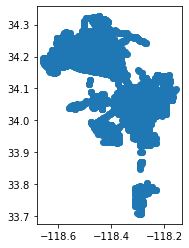

In [48]:
#our bus stops from earlier extend outside city boundaries
#join with city shape file to fix this
la_bus = gpd.sjoin(bus, city)
la_bus.plot()

(-118.69379615000001, -118.12964684999997, 33.6719924, 34.3689876)

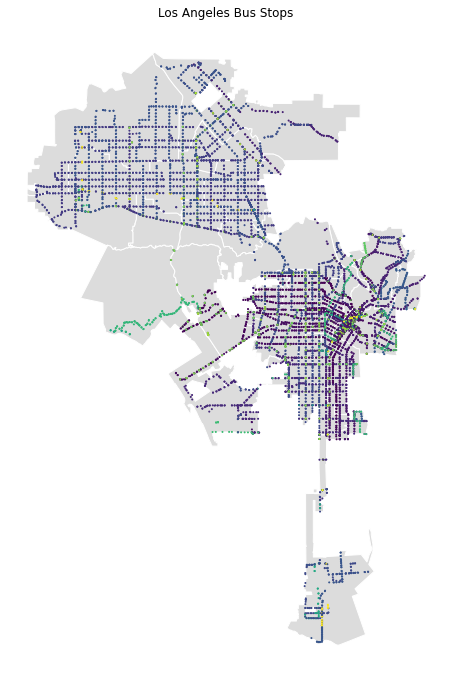

In [49]:
#let's look at bus stops in context
base=city.plot(figsize=(12,12),color='gainsboro', 
                               edgecolor='white')

ax5 = la_bus.plot(ax=base, 
                     column='line',
                     legend=False,
                     markersize=1)

# add a title
ax5.set_title('Los Angeles Bus Stops')

# get rid of the axis
ax5.axis('off')

(-118.69383140000001, -118.12890660000001, 33.6719924, 34.3689876)

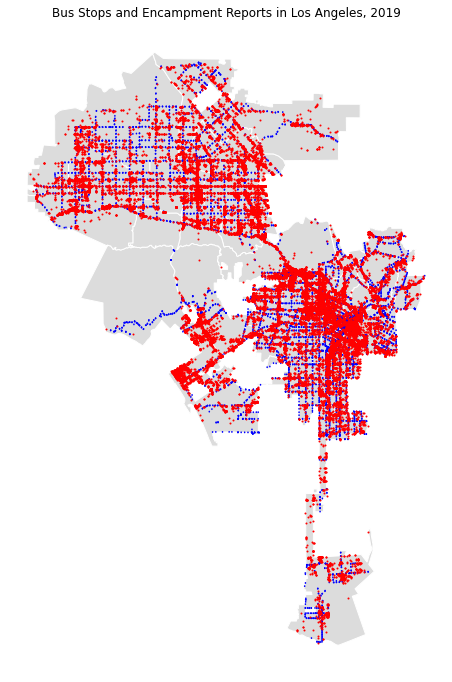

In [112]:
#looking at encampments and transit together, there certainly appears to be correlation
base=city.plot(figsize=(12,12),color='gainsboro', edgecolor='white')
ax0 = la_bus.plot(ax=base, color='blue', markersize=2)
ax = encamp_19.plot(ax=base, color='red', markersize=1)

# add a title
ax.set_title('Bus Stops and Encampment Reports in Los Angeles, 2019')

# get rid of the axis
ax.axis('off')

(-118.69403856345492, -118.12889673507358, 33.6719924, 34.3689876)

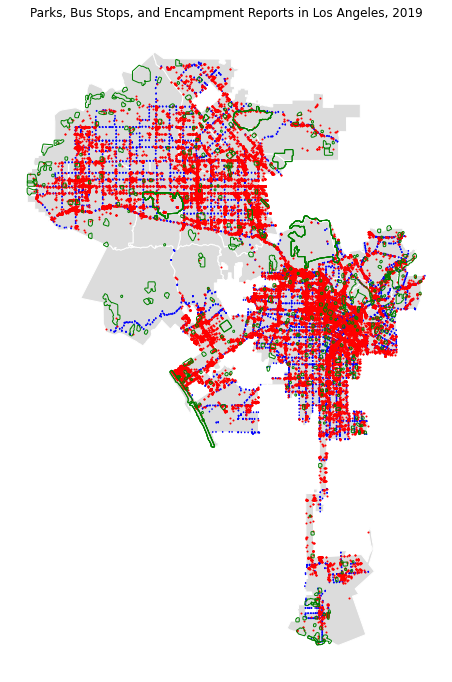

In [111]:
#my next step will be to look at potential service locations by adding transit accessibility
#to the park-encampment dynamic
base=city.plot(figsize=(12,12),color='gainsboro', edgecolor='white')
ax0 = la_bus.plot(ax=base, color='blue', markersize=2)
ax = encamp_19.plot(ax=base, color='red', markersize=1)
ay = park_info.plot(ax=base, color='none', edgecolor='green')

# add a title
ax.set_title('Parks, Bus Stops, and Encampment Reports in Los Angeles, 2019')

# get rid of the axis
ax.axis('off')